<a href="https://colab.research.google.com/github/hvkchaitanya7/grp3capstoneprj/blob/main/ImageCaptiongenerator_Transformer_Resnet50.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#from google.colab import drive
#drive.mount('/content/gdrive')

Mounted at /content/gdrive


# New Section

To download Flickr Data set and unzip it . It has 8000 images and we will be using 5000 for training , 1000 validation and 2000 for testing 

In [ ]:
!rm -rf Flickr8k_Dataset.zip
!rm -rf Flickr8k_text.zip
!wget https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_Dataset.zip -O Flickr8k_Dataset.zip
!wget https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_text.zip -O Flickr8k_text.zip
!unzip Flickr8k_Dataset.zip
!unzip Flickr8k_text.zip

In [ ]:
#Importing all libraries for Keras , Tensorflow and Resnet50

In [2]:
import string
import numpy as np
import pandas as pd 
from numpy import array
from PIL import Image
import pickle

import matplotlib.pyplot as plt
import keras
import sys, time, os, warnings 
warnings.filterwarnings("ignore")
import re

import tensorflow as tf
from tqdm import tqdm

from nltk.translate.bleu_score import sentence_bleu

from keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import plot_model
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense, BatchNormalization
from keras.layers import LSTM
from keras.layers import Embedding
from keras.layers import Dropout
from keras.layers.merge import add
from keras.callbacks import ModelCheckpoint
from keras.preprocessing.image import load_img, img_to_array
from keras.preprocessing.text import Tokenizer
from tensorflow.keras.applications.resnet50 import ResNet50
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

In [3]:
image_path = "/content/Flicker8k_Dataset"
dir_Flickr_text = "/content/Flickr8k.token.txt"

jpgs = os.listdir(image_path)
print("Total Images in Dataset = {}".format(len(jpgs)))

Total Images in Dataset = 8091


In [4]:
#check Image file name to Caption combination derived from the Flick8 dataset

In [5]:
file = open(dir_Flickr_text,'r')
text = file.read()
file.close()

datatxt = []
for line in text.split('\n'):
    col = line.split('\t')
    if len(col) == 1:
        continue
    w = col[0].split("#")
    datatxt.append(w + [col[1].lower()])

data = pd.DataFrame(datatxt,columns=["filename","index","caption"])
data = data.reindex(columns =['index','filename','caption'])
data = data[data['filename'] != '2258277193_586949ec62.jpg.1']


uni_filenames = np.unique(data.filename.values)
data.head()

,index,filename,caption
0,0,1000268201_693b08cb0e.jpg,a child in a pink dress is climbing up a set o...
1,1,1000268201_693b08cb0e.jpg,a girl going into a wooden building .
2,2,1000268201_693b08cb0e.jpg,a little girl climbing into a wooden playhouse .
3,3,1000268201_693b08cb0e.jpg,a little girl climbing the stairs to her playh...
4,4,1000268201_693b08cb0e.jpg,a little girl in a pink dress going into a woo...


Print some images along with captions to check the Flickr Data that was imported

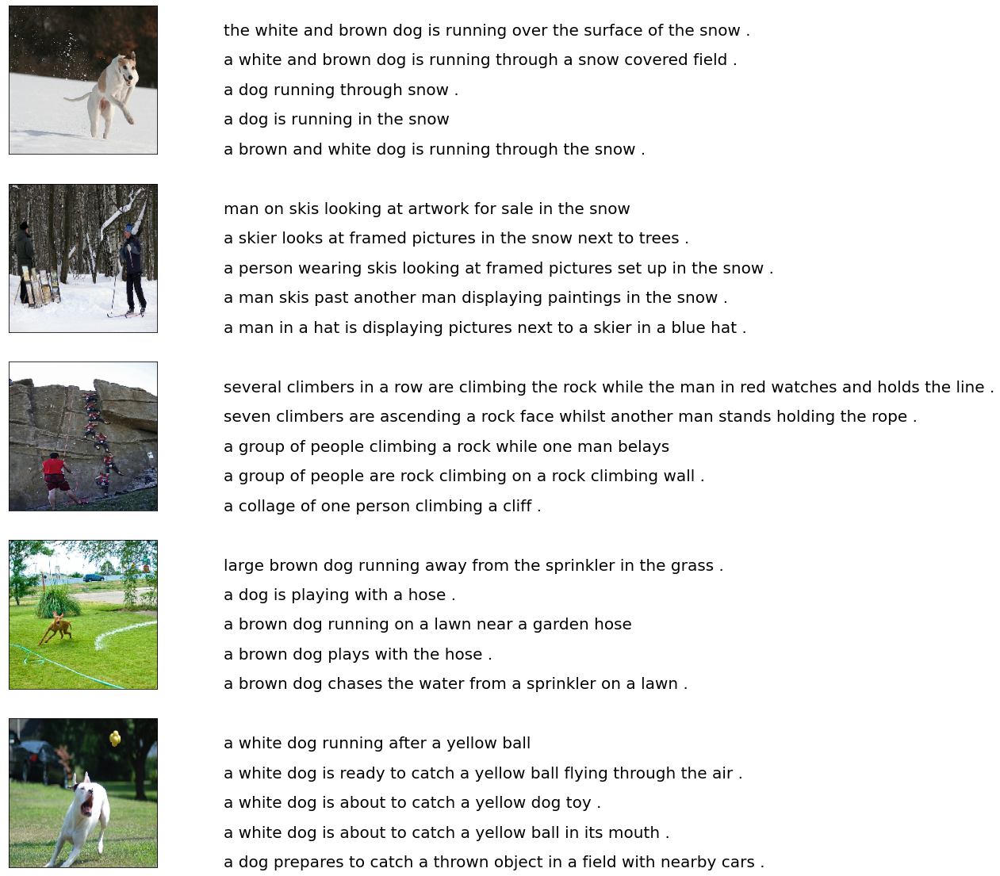

In [6]:
from keras.preprocessing.image import load_img, img_to_array

npic = 5
npix = 224
target_size = (npix,npix,3)

count = 1
fig = plt.figure(figsize=(10,20))
for jpgfnm in uni_filenames[10:15]:
    filename = image_path + '/' + jpgfnm
    captions = list(data["caption"].loc[data["filename"]==jpgfnm].values)
    image_load = load_img(filename, target_size=target_size)
    
    ax = fig.add_subplot(npic,2,count,xticks=[],yticks=[])
    ax.imshow(image_load)
    count += 1
    
    ax = fig.add_subplot(npic,2,count)
    plt.axis('off')
    ax.plot()
    ax.set_xlim(0,1)
    ax.set_ylim(0,len(captions))
    for i, caption in enumerate(captions):
        ax.text(0,i,caption,fontsize=20)
    count += 1
plt.show()

In [7]:
# Get all the words available i the captions by splitting the sentences

In [8]:
vocabulary = []
for txt in data.caption.values:
    vocabulary.extend(txt.split())
print('Vocabulary Size: %d' % len(set(vocabulary)))

Vocabulary Size: 8918


In [25]:
# crearting a list of Image file names and captions

In [26]:
img = data["filename"].tolist()
caption = data["caption"].tolist()

In [27]:
print(f"len(img) : {len(img)}")
print(f"len(caption) : {len(caption)}")

len(img) : 40455
len(caption) : 40455


In [28]:
""" Removing punctuations , Single characters , Numeric values from the word/Vocabulary , having them would make increase the probability of such words over others due to repetitive usage
giving undesired results """
# To remove punctuations
def remove_punctuation(text_original):
    text_no_punctuation = text_original.translate(string.punctuation)
    return(text_no_punctuation)

# To remove single characters
def remove_single_character(text):
    text_len_more_than1 = ""
    for word in text.split():
        if len(word) > 1:
            text_len_more_than1 += " " + word
    return(text_len_more_than1)

# To remove numeric values
def remove_numeric(text):
    text_no_numeric = ""
    for word in text.split():
        isalpha = word.isalpha()
        if isalpha:
            text_no_numeric += " " + word
    return(text_no_numeric)

In [29]:
""" Cleaning up the original text without punctuations, single characters and numeric values """

' Cleaning up the original text without punctuations, single characters and numeric values '

In [30]:
def text_clean(text_original):
    text = remove_punctuation(text_original)
    text = remove_single_character(text)
    text = remove_numeric(text)
    return(text)
    
for i, caption in enumerate(data.caption.values):
    newcaption = text_clean(caption)
    data["caption"].iloc[i] = newcaption

In [31]:
#building clean vocabulary
clean_vocabulary = []
for txt in data.caption.values:
    clean_vocabulary.extend(txt.split())
print('Clean Vocabulary Size: %d' % len(set(clean_vocabulary)))

Clean Vocabulary Size: 8357


In [32]:
# adding <start> and <end> tags to sentences to identify the start and end of the sentences while looping through words in sentence
PATH = "/content/Flicker8k_Dataset/"
all_captions = []

for caption  in data["caption"].astype(str):
    caption = '<start> ' + caption+ ' <end>'
    all_captions.append(caption)
all_captions[:10]

['<start>  child in pink dress is climbing up set of stairs in an entry way <end>',
 '<start>  girl going into wooden building <end>',
 '<start>  little girl climbing into wooden playhouse <end>',
 '<start>  little girl climbing the stairs to her playhouse <end>',
 '<start>  little girl in pink dress going into wooden cabin <end>',
 '<start>  black dog and spotted dog are fighting <end>',
 '<start>  black dog and dog playing with each other on the road <end>',
 '<start>  black dog and white dog with brown spots are staring at each other in the street <end>',
 '<start>  two dogs of different breeds looking at each other on the road <end>',
 '<start>  two dogs on pavement moving toward each other <end>']

In [33]:
#building path to read each image from the content downloaded
all_img_name_vector = []

for annot in data["filename"]:
    full_image_path = PATH + annot

    all_img_name_vector.append(full_image_path)
all_img_name_vector[:10]

['/content/Flicker8k_Dataset/1000268201_693b08cb0e.jpg',
 '/content/Flicker8k_Dataset/1000268201_693b08cb0e.jpg',
 '/content/Flicker8k_Dataset/1000268201_693b08cb0e.jpg',
 '/content/Flicker8k_Dataset/1000268201_693b08cb0e.jpg',
 '/content/Flicker8k_Dataset/1000268201_693b08cb0e.jpg',
 '/content/Flicker8k_Dataset/1001773457_577c3a7d70.jpg',
 '/content/Flicker8k_Dataset/1001773457_577c3a7d70.jpg',
 '/content/Flicker8k_Dataset/1001773457_577c3a7d70.jpg',
 '/content/Flicker8k_Dataset/1001773457_577c3a7d70.jpg',
 '/content/Flicker8k_Dataset/1001773457_577c3a7d70.jpg']

In [34]:
print(f"len(all_img_name_vector) : {len(all_img_name_vector)}")
print(f"len(all_captions) : {len(all_captions)}")

len(all_img_name_vector) : 40455
len(all_captions) : 40455


In [35]:
def data_limiter(num,total_captions,all_img_name_vector):
  train_captions, img_name_vector = shuffle(total_captions,all_img_name_vector,random_state=1)
  train_captions = train_captions[:num]
  img_name_vector = img_name_vector[:num]
  return train_captions,img_name_vector

In [36]:
train_captions,img_name_vector = data_limiter(40000,all_captions,all_img_name_vector)

In [37]:
print(f"len(all_img_name_vector) : {len(img_name_vector)}")
print(f"len(all_captions) : {len(train_captions)}")

len(all_img_name_vector) : 40000
len(all_captions) : 40000


In [38]:
#Loading an image with (224,224,3) for passing to Encoder Resnet50
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (224, 224))
    return img, image_path

In [39]:
image_model_ic = tf.keras.applications.InceptionV3(include_top=False,weights='imagenet')
#Using Pretrained Resnet50 as encoder and taking Input size of (224,224,3)
image_model = ResNet50(include_top=False,weights='imagenet',input_shape=(224, 224,3),pooling="avg")
new_input = image_model.input
hidden_layer = image_model.layers[-2].output

image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

In [40]:
image_model_ic.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv2d_94 (Conv2D)             (None, None, None,   864         ['input_3[0][0]']                
                                32)                                                               
                                                                                                  
 batch_normalization_94 (BatchN  (None, None, None,   96         ['conv2d_94[0][0]']              
 ormalization)                  32)                                                    

In [41]:
image_model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_4[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

In [42]:
# Get unique images
encode_train = sorted(set(img_name_vector))

# Batch size 16
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
image_dataset = image_dataset.map(
  load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(16)
#Building Image feature vector using Resnet50 Encoder
for img, path in tqdm(image_dataset):
  batch_features = image_features_extract_model(img)
  # converting image from Resnet (16,7,7,2048) to (16,49,2048)
  batch_features = tf.reshape(batch_features,
                              (batch_features.shape[0], -1, batch_features.shape[3]))

  for bf, p in zip(batch_features, path):
    path_of_feature = p.numpy().decode("utf-8")
    np.save(path_of_feature, bf.numpy())

100%|██████████| 506/506 [01:21<00:00,  6.18it/s]


In [84]:
#temp code
for img1, path1 in tqdm(image_dataset):
  batch_features1 = image_features_extract_model(img1)
  print("shape",batch_features1.shape)
  print("batch_features.shape[0]",batch_features1.shape[0])
  print("batch_features.shape[1]",batch_features1.shape[1])
  print("batch_features.shape[2]",batch_features1.shape[2])
  print("batch_features.shape[3]",batch_features1.shape[3])
  batch_features2 = tf.reshape(batch_features1,
                              (batch_features1.shape[0], -1, batch_features1.shape[3]))
  print("shape",batch_features2.shape)
  print("batch_features2.shape[0]",batch_features2.shape[0])
  print("batch_features2.shape[1]",batch_features2.shape[1])
  print("batch_features2.shape[2]",batch_features2.shape[2])
  #print("batch_features2.shape[3]",batch_features2.shape[3])
  break

  0%|          | 0/506 [00:00<?, ?it/s]

shape (16, 7, 7, 2048)
batch_features.shape[0] 16
batch_features.shape[1] 7
batch_features.shape[2] 7
batch_features.shape[3] 2048
shape (16, 49, 2048)
batch_features2.shape[0] 16
batch_features2.shape[1] 49
batch_features2.shape[2] 2048


### Preprocess and tokenize the captions

In [85]:
top_k = 5000

In [86]:
#Building a Word embedding for top 5000 words in the captions
tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k,
                                                  oov_token="<unk>",
                                                  filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')
tokenizer.fit_on_texts(train_captions)
train_seqs = tokenizer.texts_to_sequences(train_captions)

In [87]:
tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'

In [88]:
train_seqs = tokenizer.texts_to_sequences(train_captions)

In [89]:
cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post')

In [90]:
cap_vector.shape # Maximum number of words in a sentence is 33 (in the captions dataset)

(40000, 33)

### Split the data into training and testing

In [91]:
img_name_train, img_name_val, cap_train, cap_val = train_test_split(img_name_vector,
                                                                    cap_vector,
                                                                    test_size=0.2,
                                                                    random_state=0)

In [51]:
len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

(32000, 32000, 8000, 8000)

### Create a tf.data dataset for training

In [92]:
#Temp code
print(cap_train.shape)
print (type(cap_train))
cap_train[0,:]

(32000, 33)
<class 'numpy.ndarray'>


array([  2,  11, 922,  29, 171,  20,  29, 159,   6,  84, 110,   3,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0], dtype=int32)

In [93]:
BATCH_SIZE = 64
BUFFER_SIZE = 1000
num_steps = len(img_name_train) // BATCH_SIZE

In [94]:
def map_func(img_name, cap):
  img_tensor = np.load(img_name.decode('utf-8')+'.npy')
  return img_tensor, cap

In [95]:
# Check what is this ?
dataset = tf.data.Dataset.from_tensor_slices((img_name_train, cap_train))

# Use map to load the numpy files in parallel
dataset = dataset.map(lambda item1, item2: tf.numpy_function(
          map_func, [item1, item2], [tf.float32, tf.int32]),
          num_parallel_calls=tf.data.experimental.AUTOTUNE)

# Shuffle and batch
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [96]:
def get_angles(pos, i, d_model):
   angle_rates = 1 / np.power(10000, (2 * (i//2)) / np.float32(d_model))
   return pos * angle_rates

In [97]:
# Position encoding for 1d vectors ( Word embedding)
def positional_encoding_1d(position, d_model):
  angle_rads = get_angles(np.arange(position)[:, np.newaxis],
                          np.arange(d_model)[np.newaxis, :],
                          d_model)
  
  # apply sin to even indices in the array; 2i
  angle_rads[:, 0::2] = np.sin(angle_rads[:, 0::2])
  
  # apply cos to odd indices in the array; 2i+1
  angle_rads[:, 1::2] = np.cos(angle_rads[:, 1::2])
    
  pos_encoding = angle_rads[np.newaxis, ...]
    
  return tf.cast(pos_encoding, dtype=tf.float32)

In [98]:
# Position encoding for 2d vectors (image)
#Input (Batch Size, H*W , Dense layer from Encoder)
def positional_encoding_2d(row,col,d_model):
  assert d_model % 2 == 0
  # first d_model/2 encode row embedding and second d_model/2 encode column embedding
  row_pos = np.repeat(np.arange(row),col)[:,np.newaxis]
  col_pos = np.repeat(np.expand_dims(np.arange(col),0),row,axis=0).reshape(-1,1)
  angle_rads_row = get_angles(row_pos,np.arange(d_model//2)[np.newaxis,:],d_model//2)
  angle_rads_col = get_angles(col_pos,np.arange(d_model//2)[np.newaxis,:],d_model//2)
  #apply sin and cos to odd and even indices resp.
  angle_rads_row[:, 0::2] = np.sin(angle_rads_row[:, 0::2])
  angle_rads_row[:, 1::2] = np.cos(angle_rads_row[:, 1::2])
  angle_rads_col[:, 0::2] = np.sin(angle_rads_col[:, 0::2])
  angle_rads_col[:, 1::2] = np.cos(angle_rads_col[:, 1::2])
  pos_encoding = np.concatenate([angle_rads_row,angle_rads_col],axis=1)[np.newaxis, ...]

  return tf.cast(pos_encoding, dtype=tf.float32)


In [99]:
def create_padding_mask(seq):
  seq = tf.cast(tf.math.equal(seq, 0), tf.float32)
  
  # add extra dimensions to add the padding
  # to the attention logits.
  return seq[:, tf.newaxis, tf.newaxis, :]  # (batch_size, 1, 1, seq_len)

In [100]:
def create_look_ahead_mask(size):
  mask = 1 - tf.linalg.band_part(tf.ones((size, size)), -1, 0)
  return mask  # (seq_len, seq_len)

In [101]:
# This block build weights for Q - Query , K - Key , V - Value for the 8 heads
def scaled_dot_product_attention(q, k, v, mask):
  """Calculate the attention weights.
  q, k, v must have matching leading dimensions.
  k, v must have matching penultimate dimension, i.e.: seq_len_k = seq_len_v.
  The mask has different shapes depending on its type(padding or look ahead) 
  but it must be broadcastable for addition.
  
  Args:
    q: query shape == (..., seq_len_q, depth)
    k: key shape == (..., seq_len_k, depth)
    v: value shape == (..., seq_len_v, depth_v)
    mask: Float tensor with shape broadcastable 
          to (..., seq_len_q, seq_len_k). Defaults to None.
    
  Returns:
    output, attention_weights
  """

  matmul_qk = tf.matmul(q, k, transpose_b=True)  # (..., seq_len_q, seq_len_k)
  
  # scale matmul_qk
  dk = tf.cast(tf.shape(k)[-1], tf.float32)
  scaled_attention_logits = matmul_qk / tf.math.sqrt(dk)

  # add the mask to the scaled tensor.
  if mask is not None:
    scaled_attention_logits += (mask * -1e9)  #adding -Inf where mask is 1 s.t. value get ignored in softmax

  # softmax is normalized on the last axis (seq_len_k) so that the scores
  # add up to 1.
  attention_weights = tf.nn.softmax(scaled_attention_logits, axis=-1)  # (..., seq_len_q, seq_len_k)

  output = tf.matmul(attention_weights, v)  # (..., seq_len_q, depth_v)

  return output, attention_weights

In [102]:
""" This class build Multihead attention layer with number of heads passed ( 8 as per paper) and builds
Weigth for q - Query , k - Key , v - Value  . Weights matrix will be as many as number of heads """
class MultiHeadAttention(tf.keras.layers.Layer):
  def __init__(self, d_model, num_heads):
    super(MultiHeadAttention, self).__init__()
    self.num_heads = num_heads
    self.d_model = d_model
    
    assert d_model % self.num_heads == 0
    
    self.depth = d_model // self.num_heads
    
    self.wq = tf.keras.layers.Dense(d_model)
    self.wk = tf.keras.layers.Dense(d_model)
    self.wv = tf.keras.layers.Dense(d_model)
    
    self.dense = tf.keras.layers.Dense(d_model)
        
  def split_heads(self, x, batch_size):
    """Split the last dimension into (num_heads, depth).
    Transpose the result such that the shape is (batch_size, num_heads, seq_len, depth)
    """
    #
    x = tf.reshape(x, (batch_size, -1, self.num_heads, self.depth))
    return tf.transpose(x, perm=[0, 2, 1, 3])
    
  def call(self, v, k, q, mask=None):
    batch_size = tf.shape(q)[0]
    
    q = self.wq(q)  # (batch_size, seq_len, d_model)
    k = self.wk(k)  # (batch_size, seq_len, d_model)
    v = self.wv(v)  # (batch_size, seq_len, d_model)
    
    q = self.split_heads(q, batch_size)  # (batch_size, num_heads, seq_len_q, depth)
    k = self.split_heads(k, batch_size)  # (batch_size, num_heads, seq_len_k, depth)
    v = self.split_heads(v, batch_size)  # (batch_size, num_heads, seq_len_v, depth)
    
    # scaled_attention.shape == (batch_size, num_heads, seq_len_q, depth)
    # attention_weights.shape == (batch_size, num_heads, seq_len_q, seq_len_k)
    scaled_attention, attention_weights = scaled_dot_product_attention(
        q, k, v, mask)
    
    scaled_attention = tf.transpose(scaled_attention, perm=[0, 2, 1, 3])  # (batch_size, seq_len_q, num_heads, depth)

    concat_attention = tf.reshape(scaled_attention, 
                                  (batch_size, -1, self.d_model))  # (batch_size, seq_len_q, d_model)

    output = self.dense(concat_attention)  # (batch_size, seq_len_q, d_model)
        
    return output, attention_weights

In [103]:
# fucntion converts the Feedforward layer vector to Model size ( 512 in this case)
def point_wise_feed_forward_network(d_model, dff):
  return tf.keras.Sequential([
      tf.keras.layers.Dense(dff, activation='relu'),  # (batch_size, seq_len, dff)
      tf.keras.layers.Dense(d_model)  # (batch_size, seq_len, d_model)
  ])

In [104]:
""" Within this block the Multihead attention layer is built to get weights for q,k,v 
 The output of MHA is passed to FFN and normalization"""
class EncoderLayer(tf.keras.layers.Layer):
  def __init__(self, d_model, num_heads, dff, rate=0.1):
    super(EncoderLayer, self).__init__()

    self.mha = MultiHeadAttention(d_model, num_heads)
    self.ffn = point_wise_feed_forward_network(d_model, dff)

    self.layernorm1 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
    self.layernorm2 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
    
    self.dropout1 = tf.keras.layers.Dropout(rate)
    self.dropout2 = tf.keras.layers.Dropout(rate)
    
  def call(self, x, training, mask=None):

    attn_output, _ = self.mha(x, x, x, mask)  # (batch_size, input_seq_len, d_model)
    attn_output = self.dropout1(attn_output, training=training)
    out1 = self.layernorm1(x + attn_output)  # (batch_size, input_seq_len, d_model)
    
    ffn_output = self.ffn(out1)  # (batch_size, input_seq_len, d_model)
    ffn_output = self.dropout2(ffn_output, training=training)
    out2 = self.layernorm2(out1 + ffn_output)  # (batch_size, input_seq_len, d_model)
    
    return out2

In [105]:
""" Decoder layer will build two MHA 
1. MHA1 = Word Embedding + Position Encoding
2. MHA2 = MHA1 + MHA_ecoded( image)
Then it creates a Feedforward layer with d_model channels ( 512 here)
Returns  batch normalized output with MHA1 and MHA2 Attention weights"""
class DecoderLayer(tf.keras.layers.Layer):
  def __init__(self, d_model, num_heads, dff, rate=0.1):
    super(DecoderLayer, self).__init__()

    self.mha1 = MultiHeadAttention(d_model, num_heads)
    self.mha2 = MultiHeadAttention(d_model, num_heads)

    self.ffn = point_wise_feed_forward_network(d_model, dff)
 
    self.layernorm1 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
    self.layernorm2 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
    self.layernorm3 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
    
    self.dropout1 = tf.keras.layers.Dropout(rate)
    self.dropout2 = tf.keras.layers.Dropout(rate)
    self.dropout3 = tf.keras.layers.Dropout(rate)
    
    
  def call(self, x, enc_output, training, 
           look_ahead_mask=None, padding_mask=None):
    # enc_output.shape == (batch_size, input_seq_len, d_model)

    # using look ahead mask so that during self attention current query dont consider future token
    attn1, attn_weights_block1 = self.mha1(x, x, x, look_ahead_mask)  # (batch_size, target_seq_len, d_model)
    attn1 = self.dropout1(attn1, training=training)
    out1 = self.layernorm1(attn1 + x)
    
    # use padding mask to avoid padded values of both enc_output and dec_input
    attn2, attn_weights_block2 = self.mha2(
        enc_output, enc_output, out1, padding_mask)  # (batch_size, target_seq_len, d_model)
    attn2 = self.dropout2(attn2, training=training)
    out2 = self.layernorm2(attn2 + out1)  # (batch_size, target_seq_len, d_model)
    
    ffn_output = self.ffn(out2)  # (batch_size, target_seq_len, d_model)
    ffn_output = self.dropout3(ffn_output, training=training)
    out3 = self.layernorm3(ffn_output + out2)  # (batch_size, target_seq_len, d_model)
    
    return out3, attn_weights_block1, attn_weights_block2

num_layer = 4
d_model = 512
dff = 2048
num_heads = 8
row_size = 7
col_size = 7
target_vocab_size = top_k + 1 # top_k = 5000
dropout_rate = 0.1

In [106]:
"""Encoder to the following
Input - Takes Image Feature vector from Resnet50 
Adds position encoding to Image vector , builds an attention vector for the image
Output - updated Image vector with attention calculated  
 """
class Encoder(tf.keras.layers.Layer):
  def __init__(self, num_layers, d_model, num_heads, dff,
               row_size,col_size,rate=0.1):
    super(Encoder, self).__init__()

    self.d_model = d_model
    self.num_layers = num_layers
    
    self.embedding = tf.keras.layers.Dense(self.d_model,activation='relu')
    self.pos_encoding = positional_encoding_2d(row_size,col_size, 
                                            self.d_model)
    
    
    self.enc_layers = [EncoderLayer(d_model, num_heads, dff, rate) 
                       for _ in range(num_layers)]
  
    self.dropout = tf.keras.layers.Dropout(rate)
        
  def call(self, x, training, mask=None):
    # shape(x) = (batch_size,seq_len(H*W),features)
    seq_len = tf.shape(x)[1]
    
    # adding embedding and position encoding.
    x = self.embedding(x)  # (batch_size, input_seq_len(H*W), d_model)
    x += self.pos_encoding[:, :seq_len, :]

    x = self.dropout(x, training=training)
    
    for i in range(self.num_layers):
      x = self.enc_layers[i](x, training, mask) # Encode layer is execture 4 times ?
    
    return x  # (batch_size, input_seq_len, d_model)

In [107]:
""" Decoder take the Word emdedding as input adds the Postion encoding to it and build a new embedding
New embedding is passed to the Decoder layer . Two key calcualtions happen in DecoderLayer
1. Calculation of Attention weights for New Word embedding 
2. Calculation of attention weights for Word Embedding + Attention Image ( out of Encoded layer)
This is passed to a feed forward output is derived"""
class Decoder(tf.keras.layers.Layer):
  def __init__(self, num_layers, d_model, num_heads, dff, target_vocab_size,
               maximum_position_encoding, rate=0.1):
    super(Decoder, self).__init__()

    self.d_model = d_model
    self.num_layers = num_layers
    
    self.embedding = tf.keras.layers.Embedding(target_vocab_size, d_model)
    self.pos_encoding = positional_encoding_1d(maximum_position_encoding, d_model)
    
    self.dec_layers = [DecoderLayer(d_model, num_heads, dff, rate) 
                       for _ in range(num_layers)]
    self.dropout = tf.keras.layers.Dropout(rate)
    
  def call(self, x, enc_output, training, 
           look_ahead_mask=None, padding_mask=None):

    seq_len = tf.shape(x)[1]
    attention_weights = {}
    
    x = self.embedding(x)  # (batch_size, target_seq_len, d_model)
    x *= tf.math.sqrt(tf.cast(self.d_model, tf.float32))# WHY ?
    x += self.pos_encoding[:, :seq_len, :]
    
    x = self.dropout(x, training=training)

    for i in range(self.num_layers):
      x, block1, block2 = self.dec_layers[i](x, enc_output, training,
                                             look_ahead_mask, padding_mask)
      
      attention_weights['decoder_layer{}_block1'.format(i+1)] = block1
      attention_weights['decoder_layer{}_block2'.format(i+1)] = block2
    
    # x.shape == (batch_size, target_seq_len, d_model)
    return x, attention_weights

In [108]:
""" This class build Encoder , Decoder and Encoder+ decoder inputs and passes build a layer size Vocab
The out of this class would a predicted """
class Transformer(tf.keras.Model):
#_int_(num_layers = 4, d_model=512 , num_heads = 8, dff=2048,row_size=7,col_soze = 7, target_vocab_size = 5000+1 
#,max_pos_encoding = vocab_size,rate=0.1 )
  def __init__(self, num_layers, d_model, num_heads, dff,row_size,col_size, 
               target_vocab_size,max_pos_encoding, rate=0.1):
    super(Transformer, self).__init__()

    self.encoder = Encoder(num_layers, d_model, num_heads, dff,row_size,col_size, rate)

    self.decoder = Decoder(num_layers, d_model, num_heads, dff, 
                           target_vocab_size,max_pos_encoding, rate)

    self.final_layer = tf.keras.layers.Dense(target_vocab_size)
# inp = Image tensor , tar = Word embedding , training = True 
  def call(self, inp, tar, training,look_ahead_mask=None, dec_padding_mask=None,enc_padding_mask=None):

    enc_output = self.encoder(inp, training, enc_padding_mask)  # (batch_size, inp_seq_len, d_model)
    
    # dec_output.shape == (batch_size, tar_seq_len, d_model)
    dec_output, attention_weights = self.decoder(
        tar, enc_output, training, look_ahead_mask, dec_padding_mask)
    
    final_output = self.final_layer(dec_output)  # (batch_size, tar_seq_len, target_vocab_size)
    
    return final_output, attention_weights

In [109]:
num_layer = 4
d_model = 512
dff = 2048
num_heads = 8
row_size = 7
col_size = 7
target_vocab_size = top_k + 1 # top_k = 5000
dropout_rate = 0.1

In [110]:
#transformer = Transformer(num_layer,d_model,num_heads,dff,row_size,col_size,target_vocab_size,max_pos_encoding=target_vocab_size,rate=dropout_rate)

In [111]:
print (target_vocab_size)

5001


In [112]:
np.arange(target_vocab_size)

array([   0,    1,    2, ..., 4998, 4999, 5000])

In [113]:
# Temp code
angle_check = get_angles(np.arange(target_vocab_size)[:, np.newaxis],
                          np.arange(512)[np.newaxis, :],
                          512)
print (angle_check.shape)
print(type(angle_check))

(5001, 512)
<class 'numpy.ndarray'>


In [114]:
# Temp code
# apply sin to even indices in the array; 2i
angle_check[:, 0::2] = np.sin(angle_check[:, 0::2])
print(angle_check.shape)
# apply cos to odd indices in the array; 2i+1
angle_check[:, 1::2] = np.cos(angle_check[:, 1::2])
pos_encoding_check = angle_check[np.newaxis, ...]
print(pos_encoding_check.shape)

(5001, 512)
(1, 5001, 512)


In [115]:
  # Temp code
  row_pos1 = np.repeat(np.arange(8),8)[:,np.newaxis]
  print("row_pos1", row_pos1.shape)
  col_pos1 = np.repeat(np.expand_dims(np.arange(8),0),8,axis=0).reshape(-1,1)
  print("row_pos1", col_pos1.shape)
  angle_rads_row1 = get_angles(row_pos1,np.arange(512//2)[np.newaxis,:],d_model//2)
  print("angle_rads_row1", angle_rads_row1.shape)
  angle_rads_col1 = get_angles(col_pos1,np.arange(512//2)[np.newaxis,:],d_model//2)
  print("angle_rads_col1", angle_rads_col1.shape)
  #apply sin and cos to odd and even indices resp.
  angle_rads_row1[:, 0::2] = np.sin(angle_rads_row1[:, 0::2])
  angle_rads_row1[:, 1::2] = np.cos(angle_rads_row1[:, 1::2])
  print("angle_rads_row1-1", angle_rads_row1.shape)
  print("angle_rads_col1-1", angle_rads_col1.shape)
  angle_rads_col1[:, 0::2] = np.sin(angle_rads_col1[:, 0::2])
  angle_rads_col1[:, 1::2] = np.cos(angle_rads_col1[:, 1::2])
  print("angle_rads_row1-2", angle_rads_row1.shape)
  print("angle_rads_col1-2", angle_rads_col1.shape)
  pos_encoding1 = np.concatenate([angle_rads_row1,angle_rads_col1],axis=1)[np.newaxis, ...]
  print("pos_encoding1", pos_encoding1.shape)

row_pos1 (64, 1)
row_pos1 (64, 1)
angle_rads_row1 (64, 256)
angle_rads_col1 (64, 256)
angle_rads_row1-1 (64, 256)
angle_rads_col1-1 (64, 256)
angle_rads_row1-2 (64, 256)
angle_rads_col1-2 (64, 256)
pos_encoding1 (1, 64, 512)


In [116]:
# What is this?
class CustomSchedule(tf.keras.optimizers.schedules.LearningRateSchedule):
  def __init__(self, d_model, warmup_steps=4000):
    super(CustomSchedule, self).__init__()
    
    self.d_model = d_model
    self.d_model = tf.cast(self.d_model, tf.float32)

    self.warmup_steps = warmup_steps
    
  def __call__(self, step):
    arg1 = tf.math.rsqrt(step)
    arg2 = step * (self.warmup_steps ** -1.5)
    
    return tf.math.rsqrt(self.d_model) * tf.math.minimum(arg1, arg2)

In [117]:
learning_rate = CustomSchedule(d_model)

optimizer = tf.keras.optimizers.Adam(learning_rate, beta_1=0.9, beta_2=0.98, 
                                     epsilon=1e-9)

In [118]:
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')

In [119]:
def loss_function(real, pred):
  mask = tf.math.logical_not(tf.math.equal(real, 0))
  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask
  
  return tf.reduce_sum(loss_)/tf.reduce_sum(mask)

In [120]:
train_loss = tf.keras.metrics.Mean(name='train_loss')
train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(
    name='train_accuracy')

In [121]:
transformer = Transformer(num_layer,d_model,num_heads,dff,row_size,col_size,target_vocab_size,max_pos_encoding=target_vocab_size,rate=dropout_rate)

In [122]:
def create_masks_decoder(tar):
  look_ahead_mask = create_look_ahead_mask(tf.shape(tar)[1])
  dec_target_padding_mask = create_padding_mask(tar)
  combined_mask = tf.maximum(dec_target_padding_mask, look_ahead_mask)
  return combined_mask

In [123]:
@tf.function
#Image tensor and correspoding caption is passed to train_step
def train_step(img_tensor, tar):
  tar_inp = tar[:, :-1] ## all word embedding except the <end>
  tar_real = tar[:, 1:] ## all word embedding except the <start>
  
  dec_mask = create_masks_decoder(tar_inp)# Setting all embeddding for future words to 0 and taking only previous words
  
  with tf.GradientTape() as tape:
    predictions, _ = transformer(img_tensor, tar_inp, 
                                 True,  
                                 dec_mask)
    loss = loss_function(tar_real, predictions)

  gradients = tape.gradient(loss, transformer.trainable_variables)    
  optimizer.apply_gradients(zip(gradients, transformer.trainable_variables))
  
  train_loss(loss)
  train_accuracy(tar_real, predictions)

In [124]:
 #temp code
 for (batch1, (img_tensor1, tar1)) in enumerate(dataset):
     print("img_tensor1", img_tensor1.shape)
     print("tar1" , tar1.shape)
     print( tar1[:, :-1].shape)
     print( tar1[:, 1:].shape)
     dec_mask1 = create_masks_decoder(tar1[:, :-1])
     print(dec_mask1.shape)
     break

img_tensor1 (64, 49, 2048)
tar1 (64, 33)
(64, 32)
(64, 32)
(64, 1, 32, 32)


In [125]:
#Epochs = 50 , Data set returns Image and All captions for images which are passed to train_step function
for epoch in range(70):
  start = time.time()
  
  train_loss.reset_states()
  train_accuracy.reset_states()
  
  for (batch, (img_tensor, tar)) in enumerate(dataset):
    train_step(img_tensor, tar)
    
    if batch % 50 == 0:
      print ('Epoch {} Batch {} Loss {:.4f} Accuracy {:.4f}'.format(
          epoch + 1, batch, train_loss.result(), train_accuracy.result()))
      
    
  print ('Epoch {} Loss {:.4f} Accuracy {:.4f}'.format(epoch + 1, 
                                                train_loss.result(), 
                                                train_accuracy.result()))

  print ('Time taken for 1 epoch: {} secs\n'.format(time.time() - start))

Epoch 1 Batch 0 Loss 8.5920 Accuracy 0.0000
Epoch 1 Batch 50 Loss 8.1863 Accuracy 0.0178
Epoch 1 Batch 100 Loss 7.7795 Accuracy 0.0245
Epoch 1 Batch 150 Loss 7.4697 Accuracy 0.0272
Epoch 1 Batch 200 Loss 7.1666 Accuracy 0.0307
Epoch 1 Batch 250 Loss 6.8848 Accuracy 0.0341
Epoch 1 Batch 300 Loss 6.6329 Accuracy 0.0379
Epoch 1 Batch 350 Loss 6.4147 Accuracy 0.0416
Epoch 1 Batch 400 Loss 6.2218 Accuracy 0.0450
Epoch 1 Batch 450 Loss 6.0513 Accuracy 0.0482
Epoch 1 Loss 5.9039 Accuracy 0.0509
Time taken for 1 epoch: 80.75765299797058 secs

Epoch 2 Batch 0 Loss 4.5402 Accuracy 0.0830
Epoch 2 Batch 50 Loss 4.4047 Accuracy 0.0803
Epoch 2 Batch 100 Loss 4.3647 Accuracy 0.0819
Epoch 2 Batch 150 Loss 4.3176 Accuracy 0.0824
Epoch 2 Batch 200 Loss 4.2637 Accuracy 0.0834
Epoch 2 Batch 250 Loss 4.2263 Accuracy 0.0843
Epoch 2 Batch 300 Loss 4.1846 Accuracy 0.0852
Epoch 2 Batch 350 Loss 4.1486 Accuracy 0.0859
Epoch 2 Batch 400 Loss 4.1097 Accuracy 0.0868
Epoch 2 Batch 450 Loss 4.0757 Accuracy 0.0876
Ep

In [126]:
transformer.save_weights('image_caption_transformer70_resnet50.h5')

In [127]:
def evaluate(image):

  temp_input = tf.expand_dims(load_image(image)[0], 0)
  img_tensor_val = image_features_extract_model(temp_input)
  img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))
  
  start_token = tokenizer.word_index['<start>']
  end_token = tokenizer.word_index['<end>']
   
  #decoder input is start token.
  decoder_input = [start_token]
  output = tf.expand_dims(decoder_input, 0) #tokens
  result = [] #word list

  for i in range(100):
      dec_mask = create_masks_decoder(output)
  
      # predictions.shape == (batch_size, seq_len, vocab_size)
      predictions, attention_weights = transformer(img_tensor_val,output,False,dec_mask)
      
      # select the last word from the seq_len dimension
      predictions = predictions[: ,-1:, :]  # (batch_size, 1, vocab_size)

      predicted_id = tf.cast(tf.argmax(predictions, axis=-1), tf.int32)
      # return the result if the predicted_id is equal to the end token
      if predicted_id == end_token:
          return result,tf.squeeze(output, axis=0), attention_weights
      # concatentate the predicted_id to the output which is given to the decoder
      # as its input.
      result.append(tokenizer.index_word[int(predicted_id)])
      output = tf.concat([output, predicted_id], axis=-1)

  return result,tf.squeeze(output, axis=0), attention_weights

BLEU-1 score: 66.66666666666666
BLEU-2 score: 36.51483716701108
BLEU-3 score: 2.764935154957498e-91
BLEU-4 score: 9.013778876140909e-153
Real Caption: young blonde child holding an airplane
Predicted Caption: young blonde boy holding toy airplane


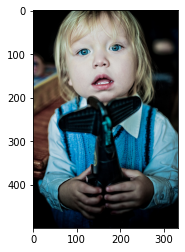

In [128]:
start_token = tokenizer.word_index['<start>']
end_token = tokenizer.word_index['<end>']
# select random image from validation data
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_weights = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

#remove <end> from result         
result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption
score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-1 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-4 score: {score*100}")

print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)


BLEU-1 score: 14.897559113742284
BLEU-2 score: 9.06636575373702
BLEU-3 score: 9.05859442474254e-92
BLEU-4 score: 3.165087820262515e-153
Real Caption: woman in red coat is smiling while people in the background are walking around in winter clothing
Predicted Caption: woman standing next to young woman dressed in red jacket


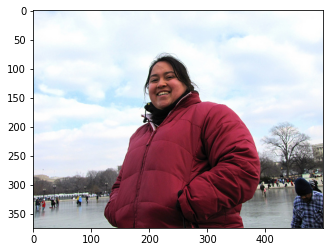

In [129]:
start_token = tokenizer.word_index['<start>']
end_token = tokenizer.word_index['<end>']
# select random image from validation data
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_weights = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

#remove <end> from result         
result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption
score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-1 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-4 score: {score*100}")

print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)


BLEU-1 score: 16.666666666666668
BLEU-2 score: 6.08970970641905e-153
BLEU-3 score: 1.4961022763680928e-183
BLEU-4 score: 1.1640469867513693e-229
Real Caption: man climbs steep rocks
Predicted Caption: man is climbing cliff with rope


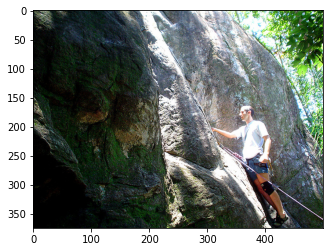

In [130]:
start_token = tokenizer.word_index['<start>']
end_token = tokenizer.word_index['<end>']
# select random image from validation data
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_weights = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

#remove <end> from result         
result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption
score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-1 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-4 score: {score*100}")

print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)


BLEU-1 score: 11.54066216255058
BLEU-2 score: 8.55878412699898
BLEU-3 score: 9.653569773357517e-92
BLEU-4 score: 3.476761986863384e-153
Real Caption: an aged woman is looking into the camera while the inside of her hut is shown
Predicted Caption: man with long hair and jean jacket looks at the camera


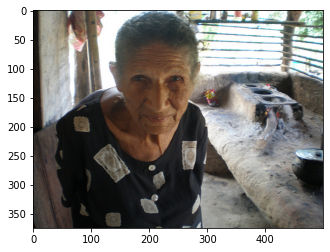

In [131]:
start_token = tokenizer.word_index['<start>']
end_token = tokenizer.word_index['<end>']
# select random image from validation data
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_weights = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

#remove <end> from result         
result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption
score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-1 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-4 score: {score*100}")

print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)


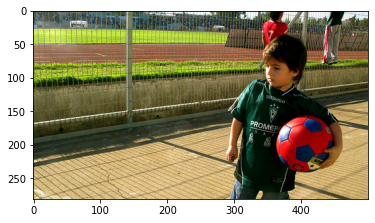

Real Caption: boy holds soccer ball while he stands next to running track
Predicted Caption: young boy in green shirt is holding red and blue soccer ball
BLEU-1 score: 25.0
BLEU-2 score: 15.075567228888179
BLEU-3 score: 1.6261759223357467e-91
BLEU-4 score: 5.791739854583281e-153


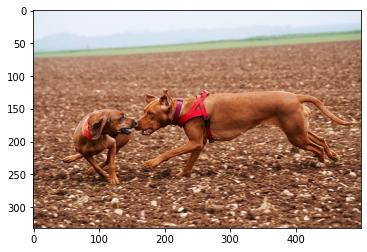

Real Caption: two brown dogs are fighting and they are both wearing red
Predicted Caption: two brown dogs wearing sweaters are wrestling in grassy field
BLEU-1 score: 45.241870901797974
BLEU-2 score: 30.161247267865317
BLEU-3 score: 25.08249895821454
BLEU-4 score: 3.793792167347796e-76


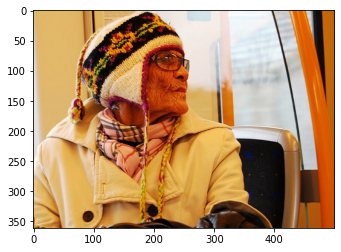

Real Caption: lady with glasses and warm hat looks int other distance
Predicted Caption: an elderly man is wearing blue helmet and sitting in front of
BLEU-1 score: 8.333333333333332
BLEU-2 score: 4.306075028866568e-153
BLEU-3 score: 1.2152126591739945e-183
BLEU-4 score: 9.788429383461836e-230


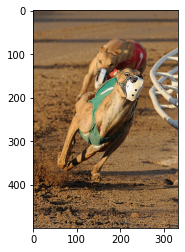

Real Caption: dog with his eyes <unk> out runs in front of another running dog
Predicted Caption: dog is running with its tongue hanging out
BLEU-1 score: 26.763071425949512
BLEU-2 score: 5.645769805042435e-153
BLEU-3 score: 1.1134317697687857e-183
BLEU-4 score: 8.200055153470431e-230


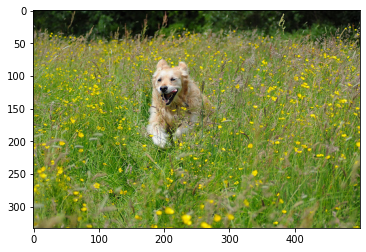

Real Caption: white dog runs through field of yellow flowers
Predicted Caption: dog runs through the long grass
BLEU-1 score: 35.826565528689464
BLEU-2 score: 32.044254369000136
BLEU-3 score: 29.169311208431857
BLEU-4 score: 4.1382219658909646e-76


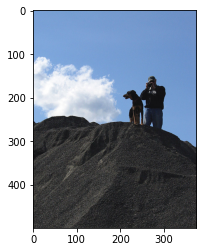

Real Caption: man and dog stand atop black <unk> mountain range
Predicted Caption: man with backpack and backpack sits on rock and looks out at the valley
BLEU-1 score: 14.285714285714285
BLEU-2 score: 5.637975647982814e-153
BLEU-3 score: 1.4284901392909564e-183
BLEU-4 score: 1.1200407237786664e-229


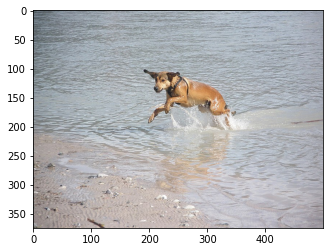

Real Caption: dog near the shore of body of water
Predicted Caption: brown dog jumps in the ocean
BLEU-1 score: 23.88437701912631
BLEU-2 score: 6.17087516772532e-153
BLEU-3 score: 1.319791889377583e-183
BLEU-4 score: 9.918892480173173e-230


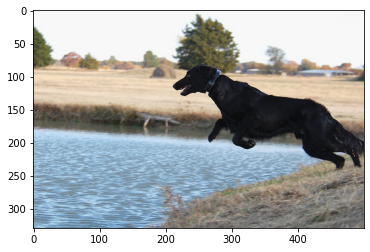

Real Caption: the black dog is running down the grassy <unk> to jump in the water below
Predicted Caption: black dog with white paws jumping into the water
BLEU-1 score: 22.818538623670754
BLEU-2 score: 17.113903967753068
BLEU-3 score: 1.344005116346986e-91
BLEU-4 score: 4.421625271317475e-153


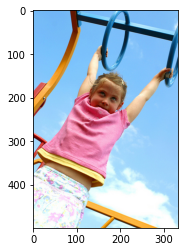

Real Caption: young girl reaches for playground rings with <unk> in her eyes
Predicted Caption: girl in pink top is hanging upside down
BLEU-1 score: 17.182231969774307
BLEU-2 score: 5.126037622123983e-153
BLEU-3 score: 1.1612566946930451e-183
BLEU-4 score: 8.853864984883468e-230


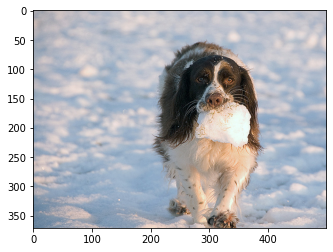

Real Caption: brown and white dog walks in the snow with big chunk of snow in his mouth
Predicted Caption: black and white dog carrying snowball
BLEU-1 score: 9.443780141878094
BLEU-2 score: 8.44677374472081
BLEU-3 score: 7.688946955349631
BLEU-4 score: 1.0908234670964951e-76


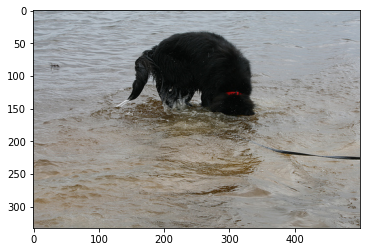

Real Caption: dog with black fur has put its head underwater
Predicted Caption: black dog with red collar sticks his head in the water
BLEU-1 score: 36.36363636363637
BLEU-2 score: 19.06925178491185
BLEU-3 score: 1.8724210775784561e-91
BLEU-4 score: 6.513869329968086e-153


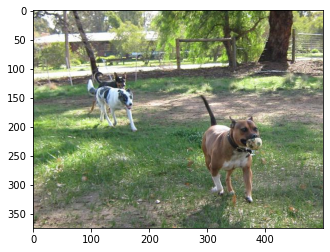

Real Caption: <unk> dog carries some fruit in his mouth while two other dogs follow him
Predicted Caption: two dogs are playing tug of war with blue toy
BLEU-1 score: 13.406400920712787
BLEU-2 score: 4.471666651098519e-153
BLEU-3 score: 1.0592485173532028e-183
BLEU-4 score: 8.166726842395623e-230


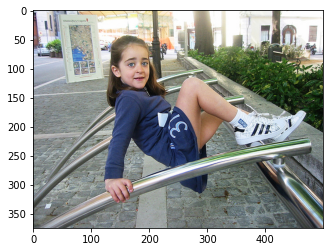

Real Caption: little girl in navy blue is posing on railing
Predicted Caption: woman in obama sits on metal bar
BLEU-1 score: 21.470779802151025
BLEU-2 score: 5.991755122558557e-153
BLEU-3 score: 1.3216063232004421e-183
BLEU-4 score: 1.0009379942300741e-229


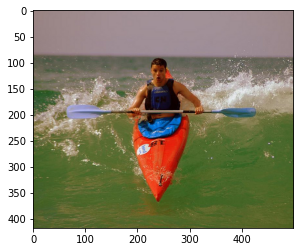

Real Caption: the male kayaker is moving through the rough water
Predicted Caption: man in red kayak
BLEU-1 score: 0
BLEU-2 score: 0
BLEU-3 score: 0
BLEU-4 score: 0


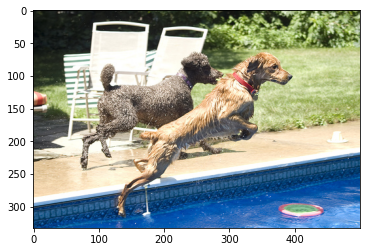

Real Caption: dog jumping into swimming pool
Predicted Caption: dog is jumping into swimming pool after toy
BLEU-1 score: 62.5
BLEU-2 score: 51.75491695067657
BLEU-3 score: 48.443397401031106
BLEU-4 score: 36.55552228545123


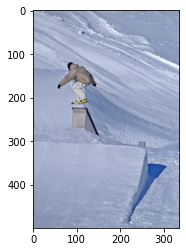

Real Caption: snowboarder performs jump on the clean white snow
Predicted Caption: snowboarder flying through the air on snowy mountain
BLEU-1 score: 37.5
BLEU-2 score: 9.134564559628536e-153
BLEU-3 score: 1.9081654987219002e-183
BLEU-4 score: 1.4256605770826505e-229


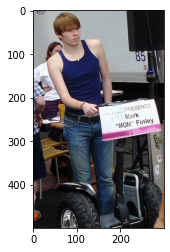

Real Caption: man in blue tank top showing his <unk>
Predicted Caption: man in blue shirt and jeans stands behind sign that says mark finley
BLEU-1 score: 23.076923076923077
BLEU-2 score: 19.61161351381841
BLEU-3 score: 18.326949791536798
BLEU-4 score: 2.9699189645069594e-76


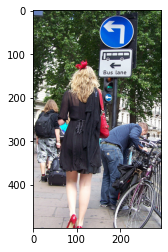

Real Caption: woman in black dress with red accessories is walking down the street
Predicted Caption: woman in white dress and woman in red costume are outside near bicycle
BLEU-1 score: 30.769230769230766
BLEU-2 score: 16.012815380508712
BLEU-3 score: 1.6861024029072228e-91
BLEU-4 score: 5.969061643530969e-153


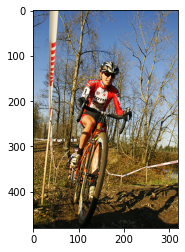

Real Caption: bicyclist riding on dirt race course
Predicted Caption: mountain biker is riding on marked out competition trail in the woods
BLEU-1 score: 16.666666666666668
BLEU-2 score: 12.309149097933275
BLEU-3 score: 1.4399259176082162e-91
BLEU-4 score: 5.233427736988301e-153


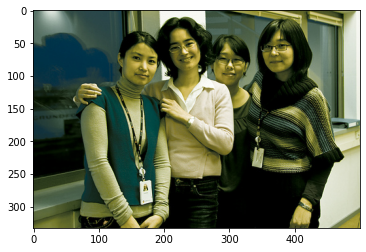

Real Caption: group of asian women standing together for photo
Predicted Caption: two girls dressed in dresses and two women are posing for picture
BLEU-1 score: 16.666666666666668
BLEU-2 score: 6.08970970641905e-153
BLEU-3 score: 1.4961022763680928e-183
BLEU-4 score: 1.1640469867513693e-229


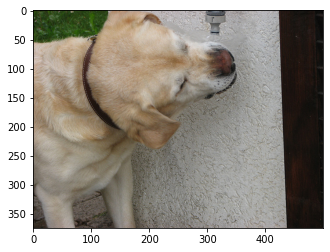

Real Caption: white dog in brown collar drinking from spigot
Predicted Caption: closeup of white dog drinking from pipe
BLEU-1 score: 49.53587998572467
BLEU-2 score: 37.833653275138545
BLEU-3 score: 2.667555534553847e-91
BLEU-4 score: 8.542604910486143e-153


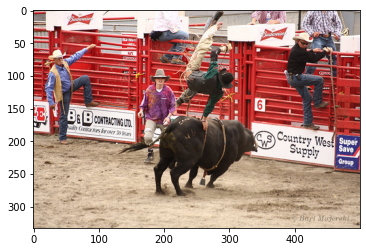

Real Caption: the man in black is flying off the full in front of red fence
Predicted Caption: man is sitting on the ground at the rodeo hanging from riding bull
BLEU-1 score: 28.49111011207126
BLEU-2 score: 7.661666913840313e-153
BLEU-3 score: 1.6650772332858048e-183
BLEU-4 score: 1.2564066184005523e-229


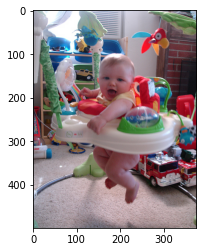

Real Caption: smilling and laughing baby in walker with fire engine airplane mobile and other toys on the floor
Predicted Caption: baby is in an activity chair in child
BLEU-1 score: 8.116311683958743
BLEU-2 score: 2.421368720783454e-153
BLEU-3 score: 5.485388217195786e-184
BLEU-4 score: 4.182269681343779e-230


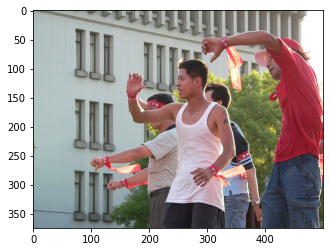

Real Caption: group of men lift their arms to signal while they look to the left
Predicted Caption: group of people look to the side and boy standing to his left
BLEU-1 score: 49.85944269612471
BLEU-2 score: 33.9734835347394
BLEU-3 score: 24.711740543930365
BLEU-4 score: 3.7614417684707045e-76


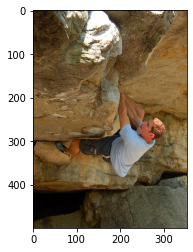

Real Caption: young man in blue shirt climbs up rock face with no ropes
Predicted Caption: man is climbing rocky mountain
BLEU-1 score: 4.93193927883213
BLEU-2 score: 1.6450342287110981e-153
BLEU-3 score: 3.8967575262557506e-184
BLEU-4 score: 3.0043709069803197e-230


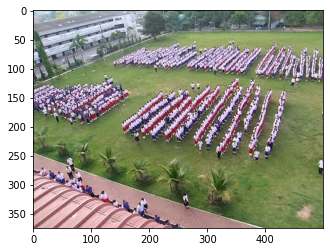

Real Caption: many people in formation on field
Predicted Caption: many people walking through the tall grass
BLEU-1 score: 28.57142857142857
BLEU-2 score: 21.82178902359924
BLEU-3 score: 2.030194004994321e-91
BLEU-4 score: 6.968148412761693e-153


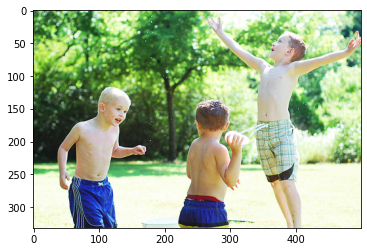

Real Caption: three kids throwing water balloons
Predicted Caption: young boy poses with dirt in front of him
BLEU-1 score: 0
BLEU-2 score: 0
BLEU-3 score: 0
BLEU-4 score: 0


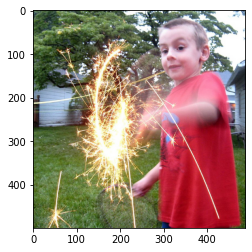

Real Caption: little boy is holding lit sparkler in the backyard
Predicted Caption: girl wearing pink shirt is standing in front of
BLEU-1 score: 22.22222222222222
BLEU-2 score: 7.031791076575252e-153
BLEU-3 score: 1.6309584783156365e-183
BLEU-4 score: 1.2508498911928378e-229


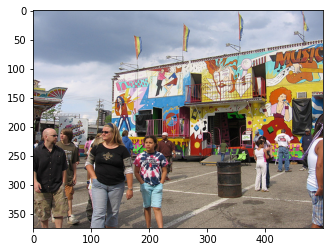

Real Caption: people walk outside of building that has many <unk> painted on it
Predicted Caption: group of people are standing in front of some tall buildings
BLEU-1 score: 16.601831205132044
BLEU-2 score: 5.807771944031223e-153
BLEU-3 score: 1.4022212212919266e-183
BLEU-4 score: 1.0862663708453602e-229


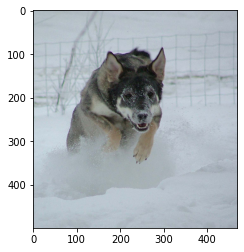

Real Caption: balck and tan dog running through the snow
Predicted Caption: dog runs through the snow
BLEU-1 score: 43.90493088752211
BLEU-2 score: 34.70989552921196
BLEU-3 score: 29.985060665861457
BLEU-4 score: 4.050364452470092e-76


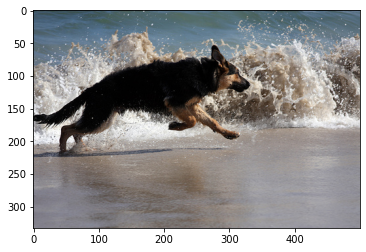

Real Caption: dog running in the surf
Predicted Caption: dog runs on the beach with wave in the background
BLEU-1 score: 30.0
BLEU-2 score: 18.257418583505533
BLEU-3 score: 1.8241769048702254e-91
BLEU-4 score: 6.373704167435468e-153


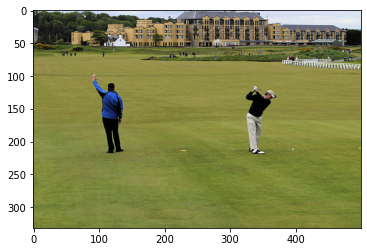

Real Caption: two people are on golf course playing golf
Predicted Caption: man in white shirt walks on field in front of green building
BLEU-1 score: 8.333333333333332
BLEU-2 score: 4.306075028866568e-153
BLEU-3 score: 1.2152126591739945e-183
BLEU-4 score: 9.788429383461836e-230


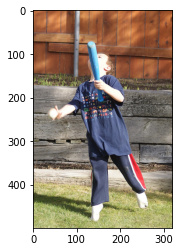

Real Caption: little boy plays baseball with himself
Predicted Caption: the little boy wearing no shirt is holding large baseball
BLEU-1 score: 30.0
BLEU-2 score: 18.257418583505533
BLEU-3 score: 1.8241769048702254e-91
BLEU-4 score: 6.373704167435468e-153


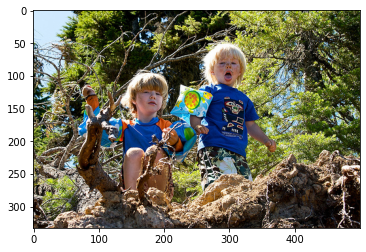

Real Caption: there are two kids in swimmies playing outside next to some trees
Predicted Caption: two boys are sitting on clump of dirt
BLEU-1 score: 15.163266492815836
BLEU-2 score: 4.5237123240565193e-153
BLEU-3 score: 1.0248054361722373e-183
BLEU-4 score: 7.813508425061864e-230


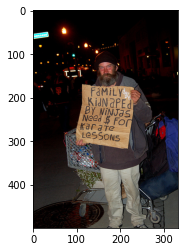

Real Caption: homeless man holding sign written on cardboard
Predicted Caption: man is standing outside near two shopping cart
BLEU-1 score: 12.500000000000004
BLEU-2 score: 5.273843307431706e-153
BLEU-3 score: 1.372396692566494e-183
BLEU-4 score: 1.0832677820940878e-229


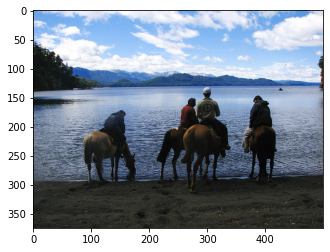

Real Caption: four <unk> look into the water
Predicted Caption: three people are on the beach near the ocean
BLEU-1 score: 11.111111111111109
BLEU-2 score: 4.972227154133551e-153
BLEU-3 score: 1.3247499323693867e-183
BLEU-4 score: 1.0518351895246306e-229


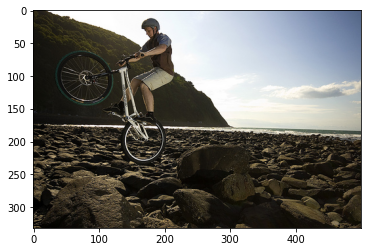

Real Caption: man on white bike doing tricks on rocky ground
Predicted Caption: man is performing trick on bicycle at rocky beach
BLEU-1 score: 33.33333333333333
BLEU-2 score: 8.612150057732662e-153
BLEU-3 score: 1.8419179593432007e-183
BLEU-4 score: 1.384292958842266e-229


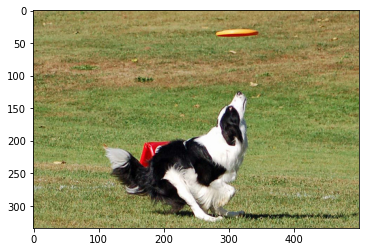

Real Caption: dog about to jump to catch frisbee
Predicted Caption: black and white dog is going after an orange frisbee
BLEU-1 score: 20.0
BLEU-2 score: 6.6709427497276e-153
BLEU-3 score: 1.5802130991274055e-183
BLEU-4 score: 1.2183324802375697e-229


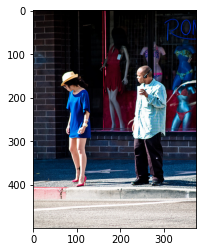

Real Caption: man and woman are standing on the curb
Predicted Caption: two people in jackets with long hair walking down road
BLEU-1 score: 0
BLEU-2 score: 0
BLEU-3 score: 0
BLEU-4 score: 0


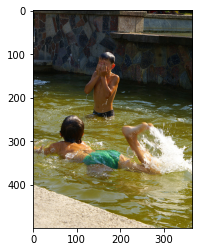

Real Caption: two boys swim on sunny day
Predicted Caption: two boys in green shorts are swimming pool
BLEU-1 score: 25.0
BLEU-2 score: 18.898223650461357
BLEU-3 score: 1.8623269155678368e-91
BLEU-4 score: 6.484592771860511e-153


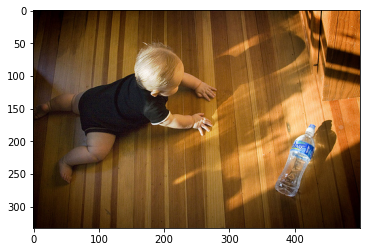

Real Caption: baby crawls on wood floor near bottle of water
Predicted Caption: the young man is standing on the wood floor beside the flips down
BLEU-1 score: 23.076923076923077
BLEU-2 score: 13.867504905630728
BLEU-3 score: 1.5466866120248002e-91
BLEU-4 score: 5.554837769749797e-153


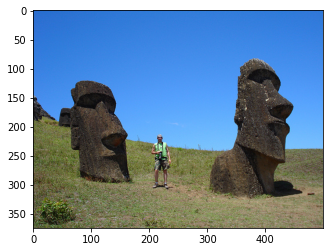

Real Caption: man stands by two face structures on easter island
Predicted Caption: man is standing in front of an mountain
BLEU-1 score: 11.031211282307446
BLEU-2 score: 4.6541503835249794e-153
BLEU-3 score: 1.2111358303072744e-183
BLEU-4 score: 9.55980462367717e-230


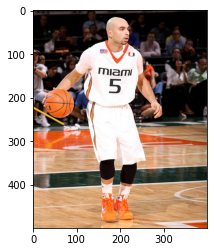

Real Caption: guy playing basketball
Predicted Caption: miami basketball player with basketball in right hand on court
BLEU-1 score: 10.000000000000002
BLEU-2 score: 4.717068855239749e-153
BLEU-3 score: 1.2835318765197404e-183
BLEU-4 score: 1.0244914152188952e-229


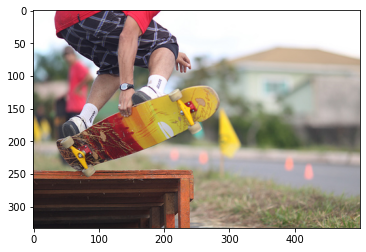

Real Caption: skateboarder ollies off ramp
Predicted Caption: man is skateboarding on ramp in front of some graffiti covered building
BLEU-1 score: 8.333333333333332
BLEU-2 score: 4.306075028866568e-153
BLEU-3 score: 1.2152126591739945e-183
BLEU-4 score: 9.788429383461836e-230


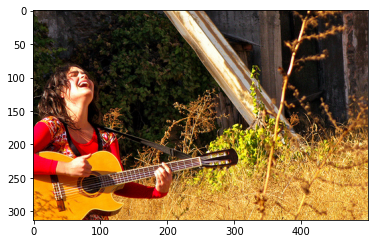

Real Caption: woman with guitar sings in front of building and grass
Predicted Caption: woman playing an instrument
BLEU-1 score: 5.578254003710746
BLEU-2 score: 1.664180761794279e-153
BLEU-3 score: 3.7700485116849887e-184
BLEU-4 score: 2.8744291130001146e-230


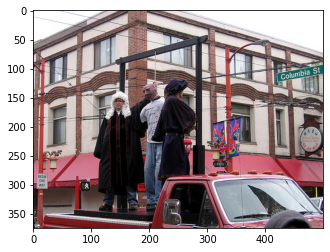

Real Caption: three people in costumes stand on the back of pickup truck
Predicted Caption: man and woman are riding past car
BLEU-1 score: 0
BLEU-2 score: 0
BLEU-3 score: 0
BLEU-4 score: 0


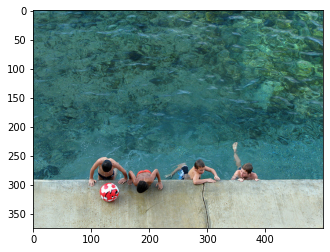

Real Caption: four boys in water are hanging on to the concrete ledge
Predicted Caption: group of four children in the pool
BLEU-1 score: 24.202205228903967
BLEU-2 score: 5.51461944293045e-153
BLEU-3 score: 1.1216189750495802e-183
BLEU-4 score: 8.324264127738904e-230


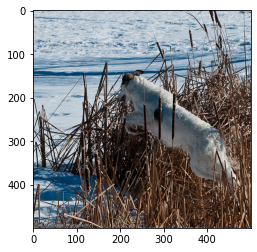

Real Caption: white dog is jumping in some cat tails
Predicted Caption: dog runs through the water
BLEU-1 score: 10.976232721880528
BLEU-2 score: 3.6610910047675876e-153
BLEU-3 score: 8.672393363093234e-184
BLEU-4 score: 6.686350417856737e-230


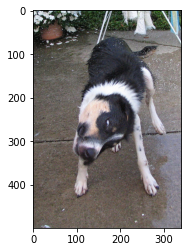

Real Caption: the dog is shaking water off of his body
Predicted Caption: dog shakes off water
BLEU-1 score: 21.487859764514255
BLEU-2 score: 3.7011334542304515e-153
BLEU-3 score: 6.730648884994797e-184
BLEU-4 score: 4.857418662028949e-230


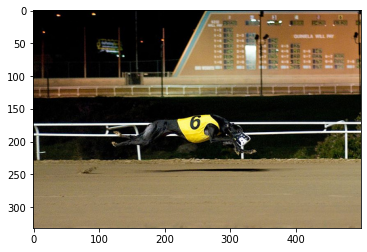

Real Caption: race dog numbered six is midair
Predicted Caption: black dog wearing yellow vest running in competition
BLEU-1 score: 12.500000000000004
BLEU-2 score: 5.273843307431706e-153
BLEU-3 score: 1.372396692566494e-183
BLEU-4 score: 1.0832677820940878e-229


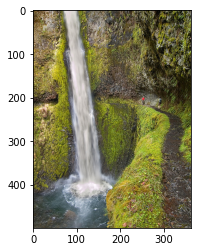

Real Caption: waterfall splashes into pool at the bottom of steep grassy hill
Predicted Caption: bunch of people in the woods
BLEU-1 score: 14.486606950235942
BLEU-2 score: 3.742824986484746e-153
BLEU-3 score: 8.004942453475685e-184
BLEU-4 score: 6.016112399618114e-230


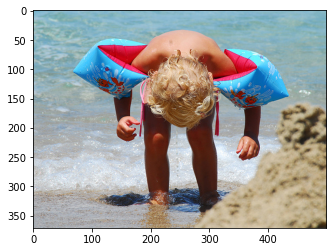

Real Caption: child in red and blue floaties looking down at the water
Predicted Caption: the little boy in the red shorts is doing back flip on beach
BLEU-1 score: 23.076923076923077
BLEU-2 score: 7.165741990418252e-153
BLEU-3 score: 1.6495292825393885e-183
BLEU-4 score: 1.2627076138080563e-229


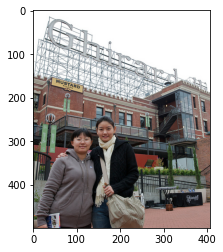

Real Caption: two young ladies pose outside of brick building and smile for the camera
Predicted Caption: two people carrying bags walk together
BLEU-1 score: 5.190053731909963
BLEU-2 score: 1.896355235282911e-153
BLEU-3 score: 4.658910721669926e-184
BLEU-4 score: 3.6248798446244946e-230


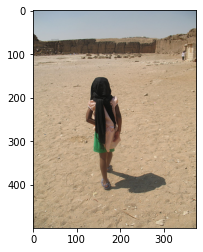

Real Caption: person with their face covered standing in desert
Predicted Caption: the brown dog has his face in the sand
BLEU-1 score: 22.22222222222222
BLEU-2 score: 7.031791076575252e-153
BLEU-3 score: 1.6309584783156365e-183
BLEU-4 score: 1.2508498911928378e-229


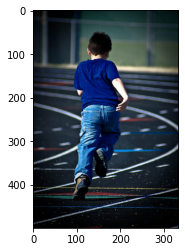

Real Caption: small boy running track
Predicted Caption: boy in blue shirt runs on colorful lines
BLEU-1 score: 12.500000000000004
BLEU-2 score: 5.273843307431706e-153
BLEU-3 score: 1.372396692566494e-183
BLEU-4 score: 1.0832677820940878e-229


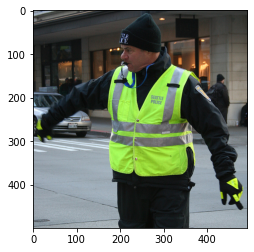

Real Caption: police officer in yellow vest directs traffic
Predicted Caption: man in blue coat and red hat stands with peace sign
BLEU-1 score: 9.09090909090909
BLEU-2 score: 4.497548684366688e-153
BLEU-3 score: 1.2473514990254889e-183
BLEU-4 score: 1.0003688322288243e-229


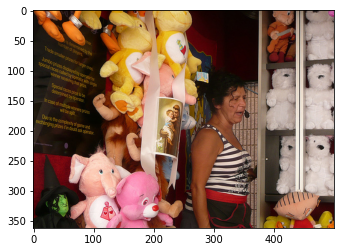

Real Caption: woman wearing black and white striped shirt standing amongst stuffed animals hanging and on shelf
Predicted Caption: the woman wearing the pink hat is standing in the middle of the parade
BLEU-1 score: 19.951345279371914
BLEU-2 score: 11.953742572821394
BLEU-3 score: 1.3749827668168215e-91
BLEU-4 score: 4.976381283078758e-153


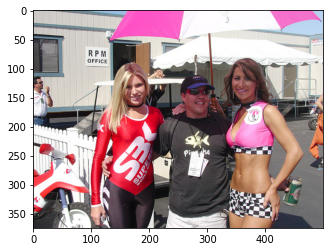

Real Caption: man has his arms around two women who are posing for picture with him
Predicted Caption: two women in skimpy dresses and one of them holding camera
BLEU-1 score: 13.84182521267043
BLEU-2 score: 10.265372320084907
BLEU-3 score: 1.1578453956891629e-91
BLEU-4 score: 4.170014774748746e-153


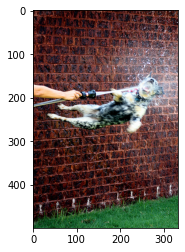

Real Caption: leaping dog sprayed by off screen person with hose
Predicted Caption: the dog is about to play near the steps
BLEU-1 score: 11.111111111111109
BLEU-2 score: 4.972227154133551e-153
BLEU-3 score: 1.3247499323693867e-183
BLEU-4 score: 1.0518351895246306e-229


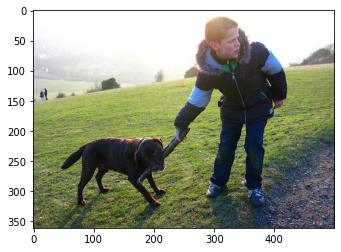

Real Caption: small dog with boy holding stick in his mouth
Predicted Caption: man and dog are holding onto the same stick in his mouth
BLEU-1 score: 50.0
BLEU-2 score: 36.92744729379982
BLEU-3 score: 33.94052617741644
BLEU-4 score: 23.462350320528


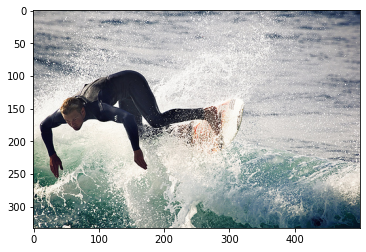

Real Caption: surfer in wetsuit crests wave
Predicted Caption: man in wetsuit is surfing
BLEU-1 score: 40.0
BLEU-2 score: 31.6227766016838
BLEU-3 score: 2.536315813271983e-91
BLEU-4 score: 8.38826642100846e-153


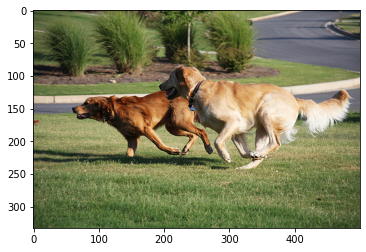

Real Caption: two large dogs running in some grass
Predicted Caption: two brown dogs are running in grassy field
BLEU-1 score: 50.0
BLEU-2 score: 26.726124191242434
BLEU-3 score: 2.2927933779232266e-91
BLEU-4 score: 7.711523862191632e-153


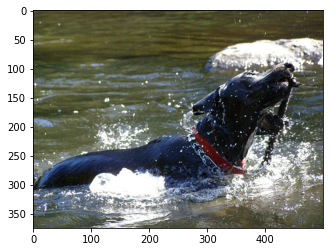

Real Caption: black dog with red collar retrieving stick from deep water
Predicted Caption: dog splashes in the water
BLEU-1 score: 14.715177646857693
BLEU-2 score: 3.470625308865635e-153
BLEU-3 score: 7.156986109817879e-184
BLEU-4 score: 5.330020010319017e-230


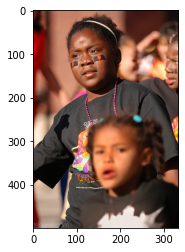

Real Caption: girl standing in group wears black shirt and pink beads
Predicted Caption: girl in red and black outfit with suit is walking with one hand and the other people behind her
BLEU-1 score: 21.052631578947366
BLEU-2 score: 6.844242849220165e-153
BLEU-3 score: 1.6047174526562592e-183
BLEU-4 score: 1.2340561512781763e-229


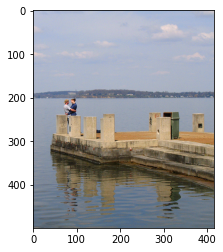

Real Caption: couple stands on dock by the water hugging
Predicted Caption: two people stand on dock looking into lake
BLEU-1 score: 25.0
BLEU-2 score: 18.898223650461357
BLEU-3 score: 1.8623269155678368e-91
BLEU-4 score: 6.484592771860511e-153


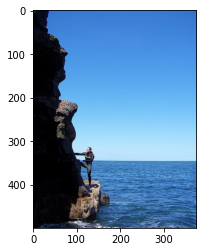

Real Caption: man admires rock formation on the water
Predicted Caption: man is standing on top of rock in the ocean
BLEU-1 score: 40.0
BLEU-2 score: 9.434137710479516e-153
BLEU-3 score: 1.9454705288851736e-183
BLEU-4 score: 1.4488496539373276e-229


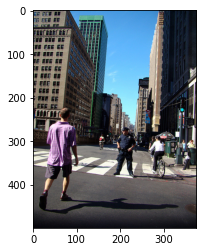

Real Caption: people in the middle of city street surrounded by large buildings
Predicted Caption: man is walking down sidewalk past group of people
BLEU-1 score: 17.794164509262398
BLEU-2 score: 5.630618124510453e-153
BLEU-3 score: 1.3059694561916118e-183
BLEU-4 score: 1.0016022933125248e-229


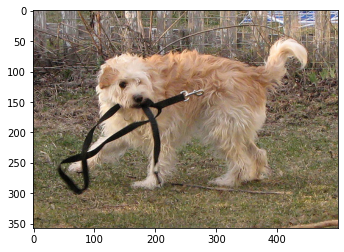

Real Caption: dog walking with his lease in his mouth
Predicted Caption: dog carries leash in its mouth
BLEU-1 score: 35.826565528689464
BLEU-2 score: 7.55774771366971e-153
BLEU-3 score: 1.490502925709351e-183
BLEU-4 score: 1.0977058971259434e-229


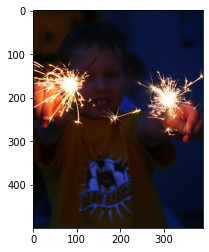

Real Caption: child holds sparklers in the dark
Predicted Caption: the man in the white shirt is playing with the ball
BLEU-1 score: 18.181818181818183
BLEU-2 score: 13.483997249264846
BLEU-3 score: 1.5208785072510163e-91
BLEU-4 score: 5.477489369001354e-153


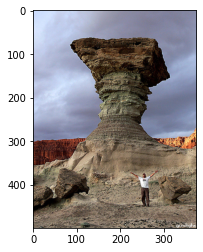

Real Caption: man standing next to huge rock formation
Predicted Caption: man extends his arms in front of rock formation
BLEU-1 score: 33.33333333333333
BLEU-2 score: 20.412414523193153
BLEU-3 score: 1.9504730631920925e-91
BLEU-4 score: 6.7393716283177e-153


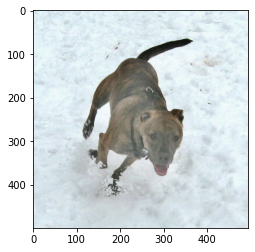

Real Caption: pitbull running in the snow
Predicted Caption: dog running through the snow
BLEU-1 score: 60.0
BLEU-2 score: 38.72983346207417
BLEU-3 score: 2.864380491069489e-91
BLEU-4 score: 9.283142785759642e-153


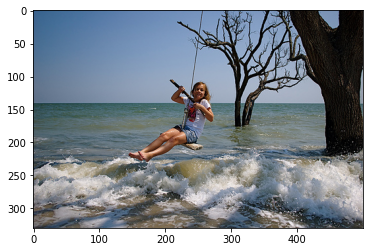

Real Caption: girl swinging from tree on rope over crashing waves
Predicted Caption: girl is sitting on made swing above the water
BLEU-1 score: 22.22222222222222
BLEU-2 score: 7.031791076575252e-153
BLEU-3 score: 1.6309584783156365e-183
BLEU-4 score: 1.2508498911928378e-229


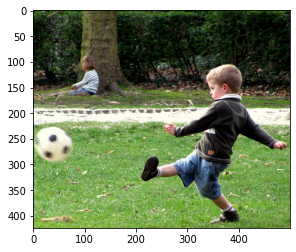

Real Caption: little boy kicks soccer ball in the park
Predicted Caption: young boy in fleece jacket kicking soccer ball with young girl in background
BLEU-1 score: 30.769230769230766
BLEU-2 score: 16.012815380508712
BLEU-3 score: 1.6861024029072228e-91
BLEU-4 score: 5.969061643530969e-153


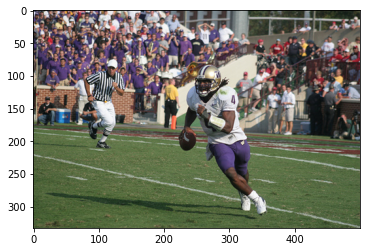

Real Caption: an american footballer in white and purple strip is making run with the ball
Predicted Caption: the football player runs the ball past the referee
BLEU-1 score: 12.750076016387393
BLEU-2 score: 9.562557012290547
BLEU-3 score: 9.909183413243782e-92
BLEU-4 score: 3.4939917753558776e-153


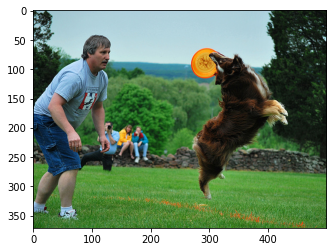

Real Caption: man stands by as dog leaps to grab frisbee while people sitting on wall watch
Predicted Caption: dog jumps in the air to catch frisbee
BLEU-1 score: 15.632325737944065
BLEU-2 score: 3.807853031210476e-153
BLEU-3 score: 7.954417236780597e-184
BLEU-4 score: 5.943037475387015e-230


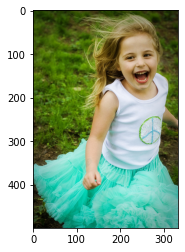

Real Caption: the little girl is wearing white with peace sign and sea foam green tutu
Predicted Caption: girl in blue and pink outfit is running through large grassy area
BLEU-1 score: 21.162043122265352
BLEU-2 score: 6.313349126968349e-153
BLEU-3 score: 1.4302312000177439e-183
BLEU-4 score: 1.0904629441531179e-229


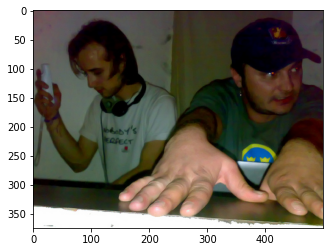

Real Caption: one man has his hands outstretched while another has headphones around his neck
Predicted Caption: two men are sitting inside of shop
BLEU-1 score: 0
BLEU-2 score: 0
BLEU-3 score: 0
BLEU-4 score: 0


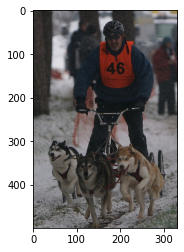

Real Caption: the dogs are pulling man on type of bike through the snow
Predicted Caption: man with red helmet is shoveling in dog mouth who is pulling carriage
BLEU-1 score: 15.384615384615385
BLEU-2 score: 5.850803834986753e-153
BLEU-3 score: 1.4606045589277217e-183
BLEU-4 score: 1.1409851298103346e-229


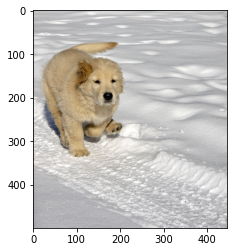

Real Caption: dog is walking in tire track in the snow
Predicted Caption: dog runs through the snow
BLEU-1 score: 26.959737847033296
BLEU-2 score: 17.40243594994629
BLEU-3 score: 1.287049118889832e-91
BLEU-4 score: 4.1711849316776385e-153


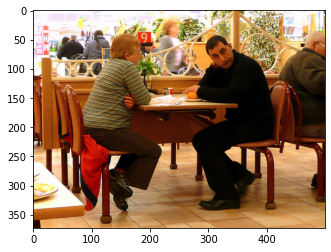

Real Caption: couple sits at table for lunch in mall
Predicted Caption: man in black suit and woman in black dress in small pink dress
BLEU-1 score: 7.6923076923076925
BLEU-2 score: 4.1371430671115044e-153
BLEU-3 score: 1.1863795531178766e-183
BLEU-4 score: 9.594503055152631e-230


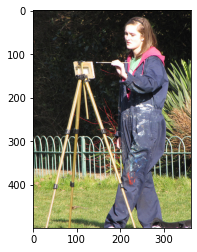

Real Caption: the lady holds her paintbrush next to the artist easel
Predicted Caption: woman standing next to her dog on red and white stick
BLEU-1 score: 27.27272727272727
BLEU-2 score: 16.514456476895408
BLEU-3 score: 1.7175994813661398e-91
BLEU-4 score: 6.061838450024688e-153


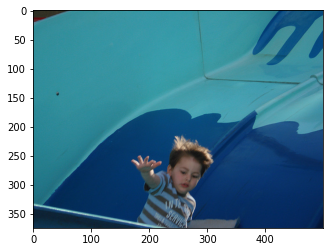

Real Caption: small boy in blue striped shirt coming down large slide
Predicted Caption: smiling boy in striped shirt going down small blue slide
BLEU-1 score: 80.0
BLEU-2 score: 42.16370213557839
BLEU-3 score: 3.014161868611131e-91
BLEU-4 score: 9.685935752407371e-153


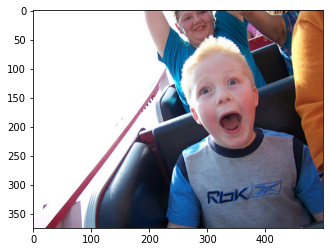

Real Caption: the blonde boy is riding with his mouth wide open
Predicted Caption: boy is sliding down huge inflatable slide
BLEU-1 score: 18.612544500887303
BLEU-2 score: 14.215565675175021
BLEU-3 score: 1.3225476692186996e-91
BLEU-4 score: 4.539324034745998e-153


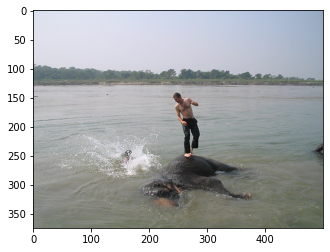

Real Caption: man is standing on an animal in the water
Predicted Caption: man is standing in the ocean and holding on the rock
BLEU-1 score: 54.54545454545454
BLEU-2 score: 40.45199174779452
BLEU-3 score: 30.053232635449127
BLEU-4 score: 4.484824319939061e-76


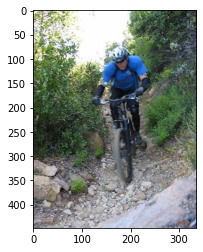

Real Caption: the mountain biker in blue rides down rocky path
Predicted Caption: man is riding his bike through wooded area
BLEU-1 score: 0
BLEU-2 score: 0
BLEU-3 score: 0
BLEU-4 score: 0


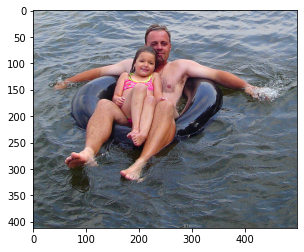

Real Caption: man and girl float on the water in an innertube
Predicted Caption: man and small girl floating on an innertube
BLEU-1 score: 58.41005873035536
BLEU-2 score: 36.05147093430547
BLEU-3 score: 2.482719610535381e-91
BLEU-4 score: 7.903999425084335e-153


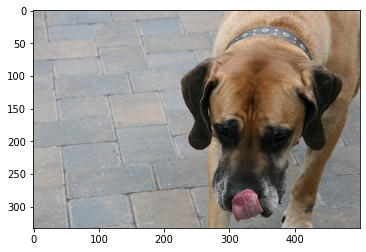

Real Caption: dog licks his nose
Predicted Caption: brown dog with white collar
BLEU-1 score: 20.0
BLEU-2 score: 6.6709427497276e-153
BLEU-3 score: 1.5802130991274055e-183
BLEU-4 score: 1.2183324802375697e-229


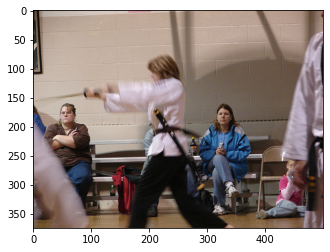

Real Caption: boy in martial uniform holding sword
Predicted Caption: two women watching people in white shirts one of those persons holding sword
BLEU-1 score: 23.076923076923077
BLEU-2 score: 13.867504905630728
BLEU-3 score: 1.5466866120248002e-91
BLEU-4 score: 5.554837769749797e-153


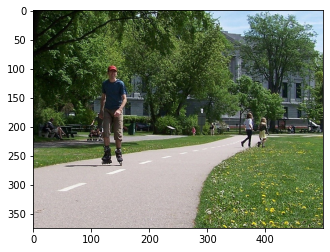

Real Caption: the man is rollerblading in red hat blue shirt and tan pants
Predicted Caption: man is rollerblading down path through an active community
BLEU-1 score: 23.88437701912631
BLEU-2 score: 20.684477252128627
BLEU-3 score: 18.96493623713919
BLEU-4 score: 2.89068959378018e-76


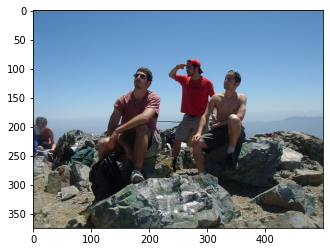

Real Caption: group of young men sit on rock and look in the distance
Predicted Caption: three people sit on rocks near stream
BLEU-1 score: 13.986904558770089
BLEU-2 score: 10.682674813114476
BLEU-3 score: 9.938645424274971e-92
BLEU-4 score: 3.4111989380225077e-153


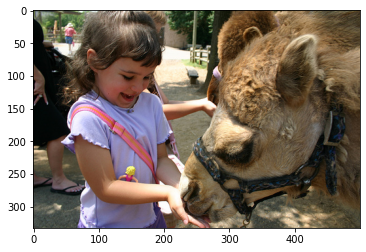

Real Caption: girl is feeding camel
Predicted Caption: young girl is holding giant stuffed animal
BLEU-1 score: 28.57142857142857
BLEU-2 score: 21.82178902359924
BLEU-3 score: 2.030194004994321e-91
BLEU-4 score: 6.968148412761693e-153


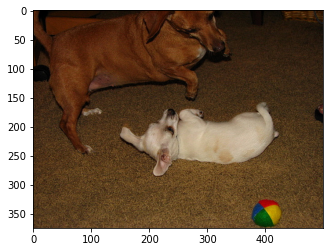

Real Caption: big brown dog plays with small white dog near ball
Predicted Caption: the brown dog is standing by the black and white ball
BLEU-1 score: 36.36363636363637
BLEU-2 score: 19.06925178491185
BLEU-3 score: 1.8724210775784561e-91
BLEU-4 score: 6.513869329968086e-153


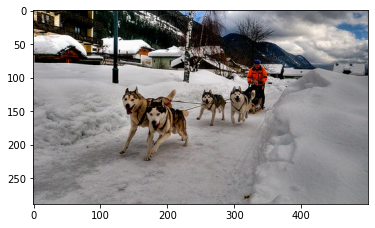

Real Caption: dog sledding team pulling man wearing bright orange jacket in the snow
Predicted Caption: pack of huskies across the snowy ground
BLEU-1 score: 6.993452279385044
BLEU-2 score: 2.7600239552551947e-153
BLEU-3 score: 6.99305433449238e-184
BLEU-4 score: 5.483065946899793e-230


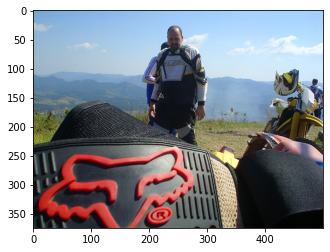

Real Caption: man stands outside
Predicted Caption: man with backpack is standing in front of mountain
BLEU-1 score: 11.111111111111109
BLEU-2 score: 4.972227154133551e-153
BLEU-3 score: 1.3247499323693867e-183
BLEU-4 score: 1.0518351895246306e-229


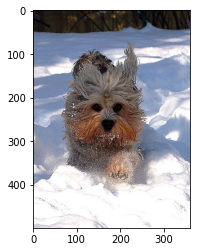

Real Caption: small tan dog runs through the snow
Predicted Caption: dog walks through the snow
BLEU-1 score: 53.62560368285115
BLEU-2 score: 42.394762134830835
BLEU-3 score: 36.62383580088321
BLEU-4 score: 4.947126313800877e-76


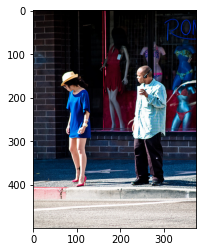

Real Caption: man and woman are standing on the curb
Predicted Caption: two people in jackets with long hair walking down road
BLEU-1 score: 0
BLEU-2 score: 0
BLEU-3 score: 0
BLEU-4 score: 0


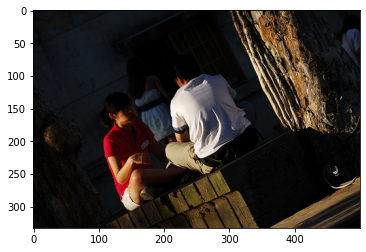

Real Caption: two people sit on brick wall and talk
Predicted Caption: two people sit on bench
BLEU-1 score: 43.90493088752211
BLEU-2 score: 42.51076653594019
BLEU-3 score: 41.69090362107932
BLEU-4 score: 36.70124608961283


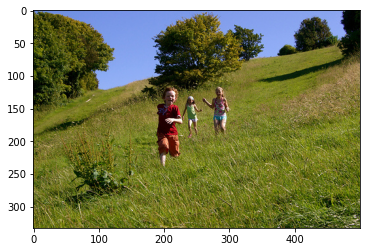

Real Caption: little boy runs down grassy hill followed behind by two girls
Predicted Caption: the children run through the tall green grass
BLEU-1 score: 0
BLEU-2 score: 0
BLEU-3 score: 0
BLEU-4 score: 0


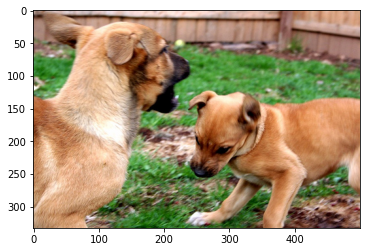

Real Caption: two dogs are facing each other on the grass beside wooden fence
Predicted Caption: dog lies on its back open trying to catch ball
BLEU-1 score: 8.18730753077982
BLEU-2 score: 3.862009336171134e-153
BLEU-3 score: 1.0508670198626023e-183
BLEU-4 score: 8.387826279040936e-230


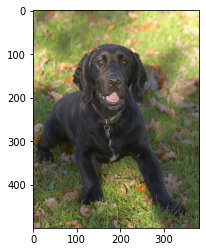

Real Caption: black dog lays on grass
Predicted Caption: black dog is running along grassy path with white carrying something in its mouth
BLEU-1 score: 14.285714285714285
BLEU-2 score: 10.482848367219184
BLEU-3 score: 1.3076481741058403e-91
BLEU-4 score: 4.829607837557234e-153


In [144]:
for j in range(100):
    start_token = tokenizer.word_index['<start>']
    end_token = tokenizer.word_index['<end>']
    # select random image from validation data
    rid = np.random.randint(0, len(img_name_val))
    image = img_name_val[rid]
    temp_image = np.array(Image.open(image))
    plt.imshow(temp_image)
    plt.show()
    real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
    caption,result,attention_weights = evaluate(image)
    first = real_caption.split(' ', 1)[1]
    real_caption = first.rsplit(' ', 1)[0]

    #remove "<unk>" in result
    for i in caption:
        if i=="<unk>":
            caption.remove(i)

    for i in real_caption:
        if i=="<unk>":
            real_caption.remove(i)

    #remove <end> from result         
    result_join = ' '.join(caption)
    result_final = result_join.rsplit(' ', 1)[0]

    real_appn = []
    real_appn.append(real_caption.split())
    reference = real_appn
    candidate = caption
    print ('Real Caption:', real_caption)
    print ('Predicted Caption:', ' '.join(caption))
    score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
    print(f"BLEU-1 score: {score*100}")
    score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
    print(f"BLEU-2 score: {score*100}")
    score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
    print(f"BLEU-3 score: {score*100}")
    score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
    print(f"BLEU-4 score: {score*100}")